# Notebook Setup

In [24]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os

data_dir = 'dataset/'

# Set plot styles for better visuals
sns.set(style="whitegrid", palette="muted")
plt.rcParams['figure.figsize'] = (10, 6)

# 1. Data Overview and Structure

In [25]:
# description
description = pd.read_csv(os.path.join(data_dir, 'WiDS_Datathon_2020_Dictionary.csv'))
description_dict = description.set_index('Variable Name').to_dict(orient='index')
# data
df = pd.read_csv(os.path.join(data_dir, 'training_v2.csv'))

df.head()

,encounter_id,patient_id,hospital_id,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,...,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
0,66154,25312,118,0,68.0,22.73,0,Caucasian,M,180.3,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular
1,114252,59342,81,0,77.0,27.42,0,Caucasian,F,160.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory
2,119783,50777,118,0,25.0,31.95,0,Caucasian,F,172.7,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic
3,79267,46918,118,0,81.0,22.64,1,Caucasian,F,165.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular
4,92056,34377,33,0,19.0,NaN,0,Caucasian,M,188.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Trauma,Trauma


- You can retrieve the description of a variable in the data set from the description dictionary as follows:

In [26]:
description_dict['immunosuppression']

{'Category': 'APACHE comorbidity',
 'Unit of Measure': nan,
 'Data Type': 'binary',
 'Description': 'Whether the patient has their immune system suppressed within six months prior to ICU admission for any of the following reasons; radiation therapy, chemotherapy, use of non-cytotoxic immunosuppressive drugs, high dose steroids (at least 0.3 mg/kg/day of methylprednisolone or equivalent for at least 6 months).',
 'Example': '1'}

In [27]:
# Print the shape and first few rows to get an idea of the data dimensions and content.
print("Number of samples\t:", df.shape[0])
print("Number of features\t:", df.shape[1])

# Analyze the distriution of missing values in the dataset


Number of samples	: 91713
Number of features	: 186


## Analyze the distriution of missing values in the dataset

In [28]:
# Calculate the percentage of missing values in each column
missing_percentages = df.isnull().mean() * 100

# Identify columns with more than 20% missing values
percentage = 20
high_missing_cols = missing_percentages[missing_percentages > percentage].index.tolist()

# Print the result
print(f"Length of inefficient columns \t : {len(high_missing_cols)} / {len(df.columns)}")
print(f"Total number of samples \t : {len(df)}")

# Remove columns with high percentage of missing values
df = df.drop(columns=high_missing_cols)

# Remove samples that have missing values in any of the columns
df = df.dropna()

# Print the result
print(f"Total number of samples after removing missing values: {len(df)}")

print(f"Column names with more than {percentage}% missing values:")
print(high_missing_cols)


Length of inefficient columns 	 : 82 / 186
Total number of samples 	 : 91713
Total number of samples after removing missing values: 45373
Column names with more than 20% missing values:
['hospital_admit_source', 'albumin_apache', 'bilirubin_apache', 'bun_apache', 'creatinine_apache', 'fio2_apache', 'hematocrit_apache', 'paco2_apache', 'paco2_for_ph_apache', 'pao2_apache', 'ph_apache', 'sodium_apache', 'urineoutput_apache', 'wbc_apache', 'd1_diasbp_invasive_max', 'd1_diasbp_invasive_min', 'd1_mbp_invasive_max', 'd1_mbp_invasive_min', 'd1_sysbp_invasive_max', 'd1_sysbp_invasive_min', 'h1_diasbp_invasive_max', 'h1_diasbp_invasive_min', 'h1_mbp_invasive_max', 'h1_mbp_invasive_min', 'h1_sysbp_invasive_max', 'h1_sysbp_invasive_min', 'h1_temp_max', 'h1_temp_min', 'd1_albumin_max', 'd1_albumin_min', 'd1_bilirubin_max', 'd1_bilirubin_min', 'd1_inr_max', 'd1_inr_min', 'd1_lactate_max', 'd1_lactate_min', 'h1_albumin_max', 'h1_albumin_min', 'h1_bilirubin_max', 'h1_bilirubin_min', 'h1_bun_max', 'h1

# 2. Visualizing the Target Variable

We clearly have an imbalanced dataset regarding the target output.

/var/folders/h2/0yz4qqt96pl7pfv1jmlkqfp40000gn/T/ipykernel_7886/3269122522.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='hospital_death', data=df, palette="Set2")


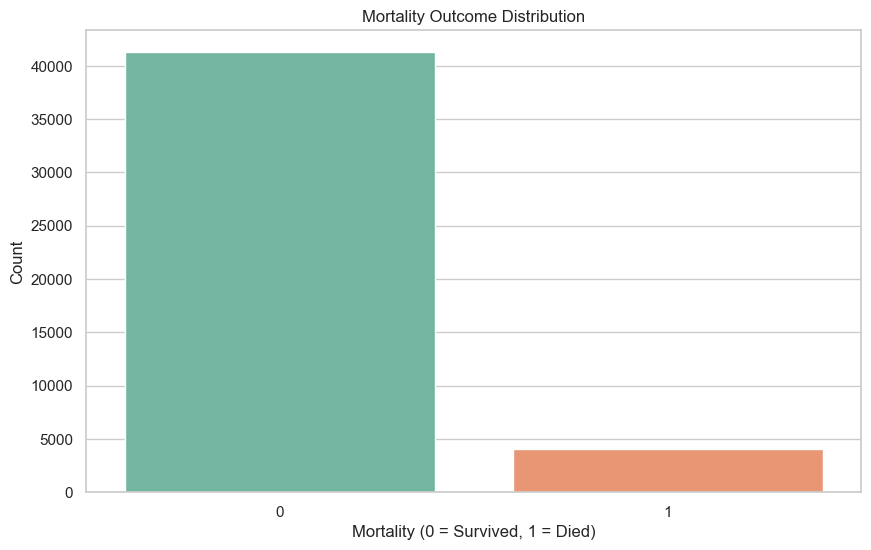

In [29]:
# Plot the distribution of the target variable
if 'hospital_death' in df.columns:
    plt.figure()
    sns.countplot(x='hospital_death', data=df, palette="Set2")
    plt.title('Mortality Outcome Distribution')
    plt.xlabel('Mortality (0 = Survived, 1 = Died)')
    plt.ylabel('Count')
    plt.show()
else:
    print("Column 'mortality' not found in the dataset.")

# 3. Correlation Heatmap

There is no apparent colletation between the mortality outcome and any of the features

In [37]:
# Identify numerical columns for analysis
numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()

# Compute correlation matrix for numeric features
method = 'kendall' # 'pearson', 'kendall', 'spearman'
corr_matrix = df[numeric_cols].corr(method=method)

plt.figure(figsize=(200, 200))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", square=True)
plt.title(f'Correlation Matrix of Numeric Features using {method.capitalize()} Method', fontsize=160)
plt.tick_params(axis='x', labelsize=90)
plt.tick_params(axis='y', labelsize=90)
plt.show()

Uncomment the code to viusalize the histogram plots of ALL features. Takes about 30s to plot. Not easy to navigate

In [38]:
# # Example: Visualize distribution of 'age' (if exists) by mortality outcome
# if 'age' in df.columns and 'hospital_death' in df.columns:
#     plt.figure()
#     sns.boxplot(x='hospital_death', y='age', data=df, palette="Set3")
#     plt.title('Age Distribution by Mortality Outcome')
#     plt.xlabel('Mortality (0 = Survived, 1 = Died)')
#     plt.ylabel('Age')
#     plt.show()

# # Loop through other numeric columns to check for potential nonlinear relationships or outliers.
# for col in numeric_cols:
#     if col != 'hospital_death':
#         plt.figure()
#         sns.boxplot(x='hospital_death', y=col, data=df, palette="Set1")
#         plt.title(f'{col} Distribution by Mortality Outcome')
#         plt.xlabel('Mortality (0 = Survived, 1 = Died)')
#         plt.ylabel(col)
#         plt.show()

# 4. Visualization of Categorical Features

There is an imbalance in:
- ethnicity
- mortality outcome
- admit type
- Bodysystem

/var/folders/h2/0yz4qqt96pl7pfv1jmlkqfp40000gn/T/ipykernel_7886/4050120009.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=col, data=df, palette="viridis", order=df[col].value_counts().index)


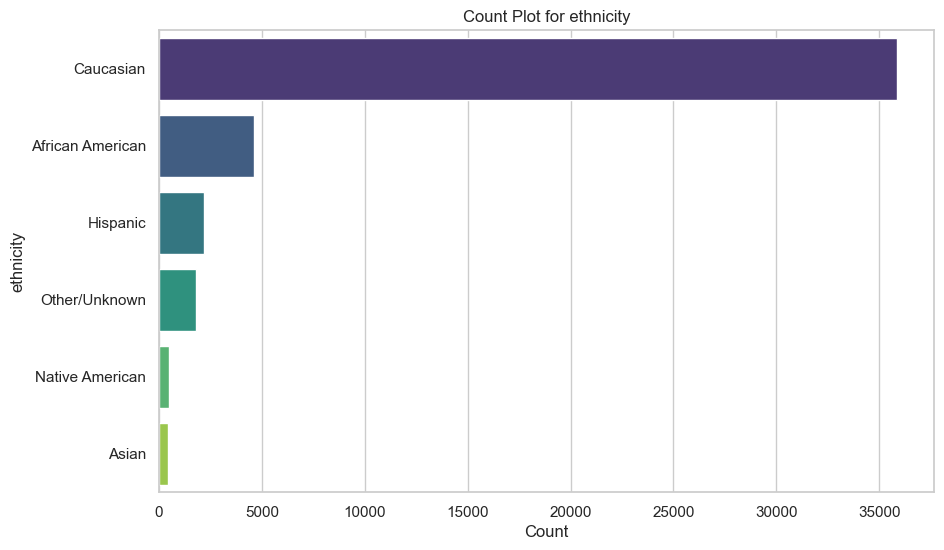

/var/folders/h2/0yz4qqt96pl7pfv1jmlkqfp40000gn/T/ipykernel_7886/4050120009.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=col, data=df, palette="viridis", order=df[col].value_counts().index)


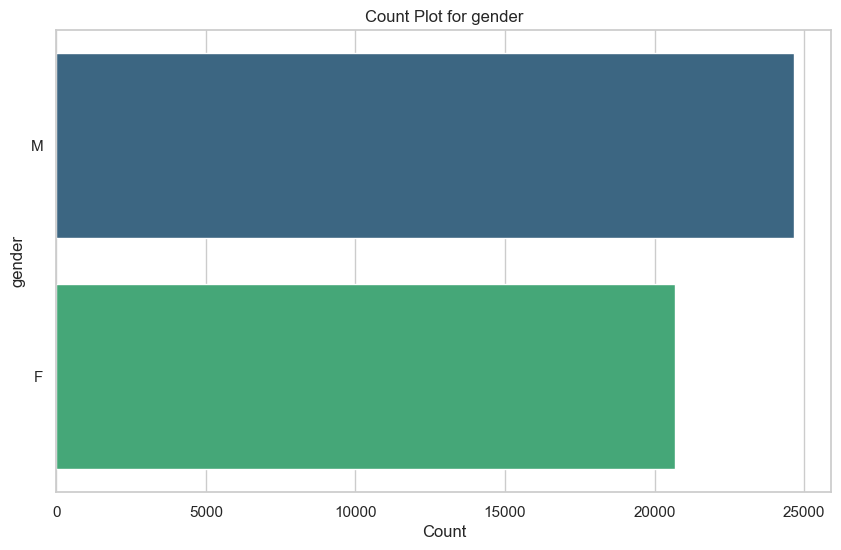

/var/folders/h2/0yz4qqt96pl7pfv1jmlkqfp40000gn/T/ipykernel_7886/4050120009.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=col, data=df, palette="viridis", order=df[col].value_counts().index)


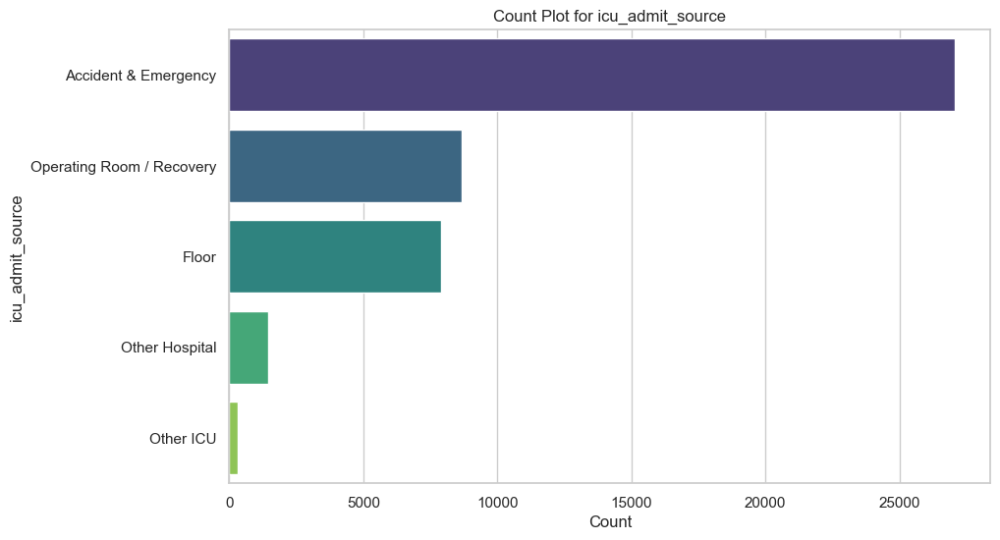

/var/folders/h2/0yz4qqt96pl7pfv1jmlkqfp40000gn/T/ipykernel_7886/4050120009.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=col, data=df, palette="viridis", order=df[col].value_counts().index)


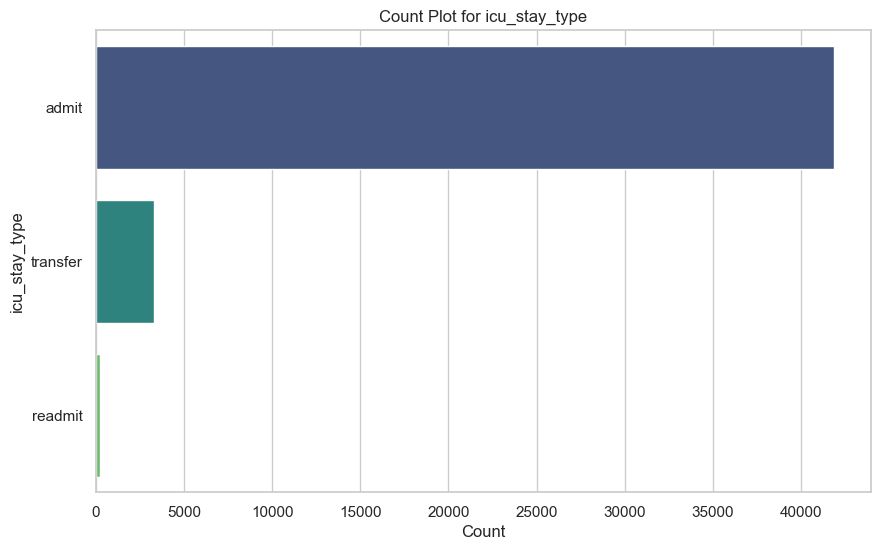

/var/folders/h2/0yz4qqt96pl7pfv1jmlkqfp40000gn/T/ipykernel_7886/4050120009.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=col, data=df, palette="viridis", order=df[col].value_counts().index)


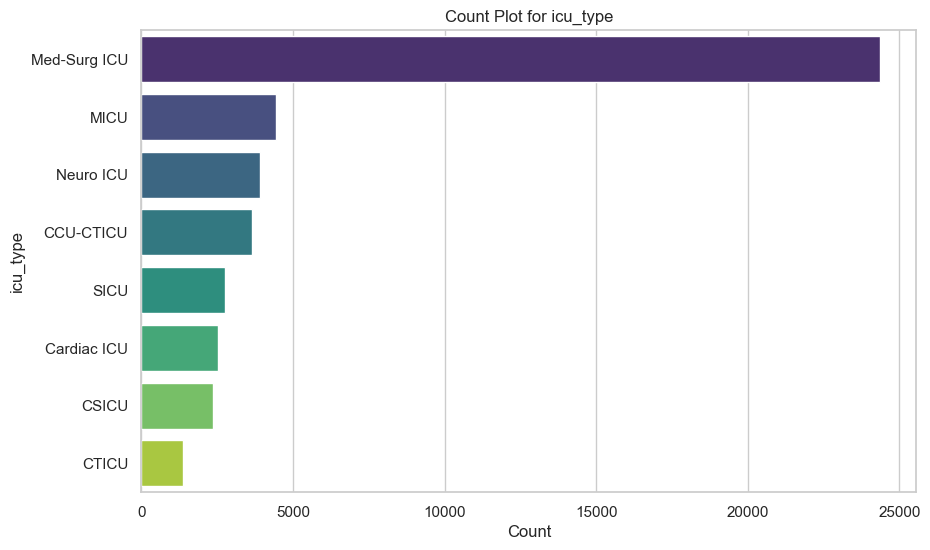

/var/folders/h2/0yz4qqt96pl7pfv1jmlkqfp40000gn/T/ipykernel_7886/4050120009.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=col, data=df, palette="viridis", order=df[col].value_counts().index)


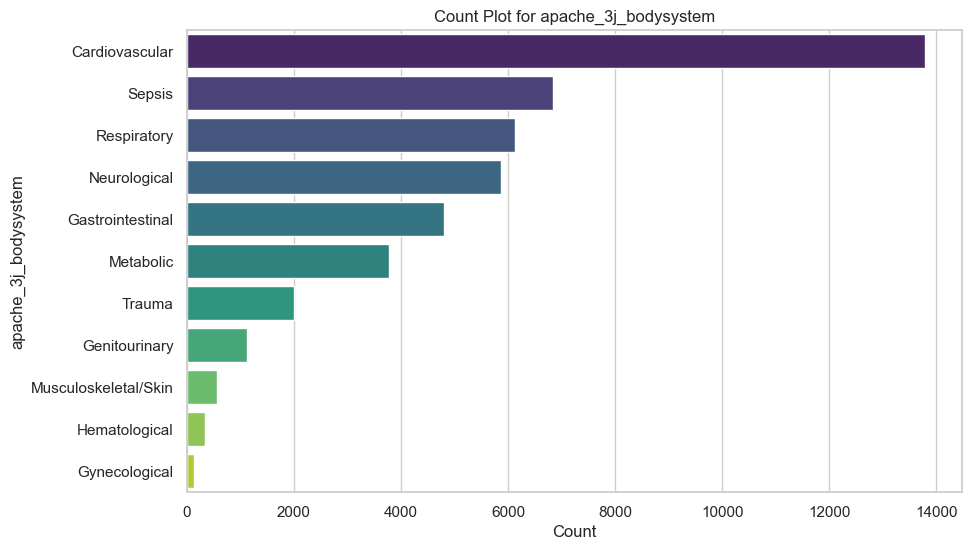

/var/folders/h2/0yz4qqt96pl7pfv1jmlkqfp40000gn/T/ipykernel_7886/4050120009.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=col, data=df, palette="viridis", order=df[col].value_counts().index)


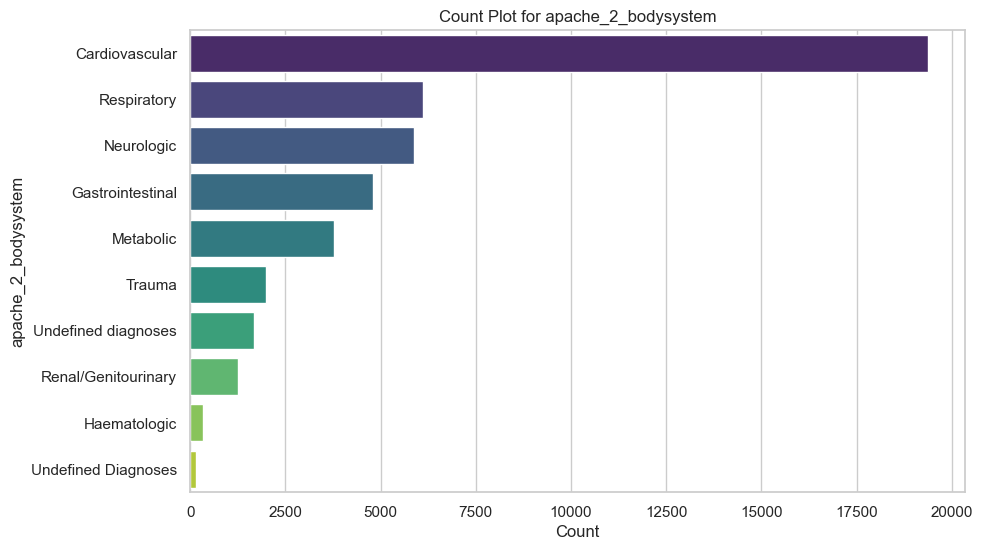

In [ ]:
# Get the list of categorical columns
categorical_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()
for col in categorical_cols:
    plt.figure()
    sns.countplot(y=col, data=df, palette="viridis", order=df[col].value_counts().index)
    plt.title(f'Count Plot for {col}')
    plt.xlabel('Count')
    plt.ylabel(col)
    plt.show()

# 5. Additional Visualizations

### Visualize the Performance of the Current APACHE IV Mortality Prediction Method

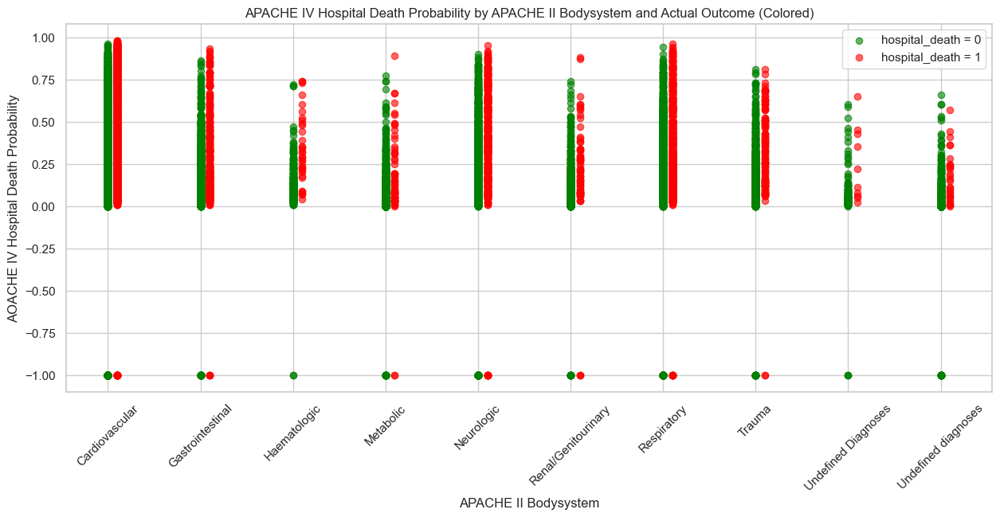

In [42]:
# Map each categorical value in 'apache_2_bodysystem' to a numeric code.
df["x_numeric"] = df["apache_2_bodysystem"].astype("category").cat.codes
categories = df["apache_2_bodysystem"].astype("category").cat.categories

# Create separate dataframes for red and green samples.
df_red = df[df["hospital_death"] == 1].copy()
df_green = df[df["hospital_death"] == 0].copy()

# Shift red samples to the right by adding a small offset.
df_red["x_numeric"] = df_red["x_numeric"] + 0.1

plt.figure(figsize=(15, 6))
plt.scatter(
    df_green["x_numeric"],
    df_green["apache_4a_hospital_death_prob"],
    color="green",
    label="hospital_death = 0",
    alpha=0.6,
)
plt.scatter(
    df_red["x_numeric"],
    df_red["apache_4a_hospital_death_prob"],
    color="red",
    label="hospital_death = 1",
    alpha=0.6,
)

# Set xticks to show the original category labels.
plt.xticks(ticks=np.arange(len(categories)), labels=categories, rotation=45)
plt.title("APACHE IV Hospital Death Probability by APACHE II Bodysystem and Actual Outcome (Colored)")
plt.xlabel("APACHE II Bodysystem")
plt.ylabel("AOACHE IV Hospital Death Probability")
plt.legend()
plt.show()

### Using Histogram

Here we can see that the current method focuses on reducing the False Negatives given that the Mortality is the Positive prediction. In healthcare domain it shoould be this way, ei, we should be cautious as well on this regard.

But I'm having hard time interpreting the red bars. They seem to have a lots of low probability predictions that turned out to be a mortality.

In [ ]:
# Extract categories and mortality subsets
categories = df["apache_2_bodysystem"].astype("category").cat.categories
df_green = df[df["hospital_death"] == 0].copy()
df_red = df[df["hospital_death"] == 1].copy()

num_categories = len(categories)

# Create a figure with 2 rows and columns for each apache_2_bodysystem category
fig, axs = plt.subplots(2, num_categories, figsize=(20 * num_categories, 55), squeeze=False)

for i, cat in enumerate(categories):
    # Subset for hospital_death = 0 (green)
    subset_green = df_green[df_green["apache_2_bodysystem"] == cat]
    axs[0, i].hist(
        subset_green["apache_4a_hospital_death_prob"],
        bins=20,
        color="green",
        alpha=0.6,
        edgecolor="black",

    )
    axs[0, i].set_title(f"{cat}\n(Samples: {len(subset_green)})", fontsize=80)
    axs[0, i].set_xlabel("Death Prob", fontsize=60)
    axs[0, i].set_ylabel("Count")
    axs[0, i].tick_params(axis='y', labelsize=60)
    axs[0, i].tick_params(axis='x', labelsize=60)
    
    # Subset for hospital_death = 1 (red)
    subset_red = df_red[df_red["apache_2_bodysystem"] == cat]
    axs[1, i].hist(
        subset_red["apache_4a_hospital_death_prob"],
        bins=20,
        color="red",
        alpha=0.6,
        edgecolor="black"
    )
    axs[1, i].set_title(f"{cat}\n(Samples: {len(subset_red)})", fontsize=80)
    axs[1, i].set_xlabel("Death Prob", fontsize=60)
    axs[1, i].set_ylabel("Count")
    axs[1, i].tick_params(axis='y', labelsize=60)
    axs[1, i].tick_params(axis='x', labelsize=60)

fig.suptitle("Histogram of Apache 4a Death Prob by Bodysystem and Actual Death", fontsize=100)
plt.tight_layout(rect=[0, 0.03, 1, 0.98])
plt.show()

APACHE IV probability predictions vs Ethnicity by Mortality Outcome

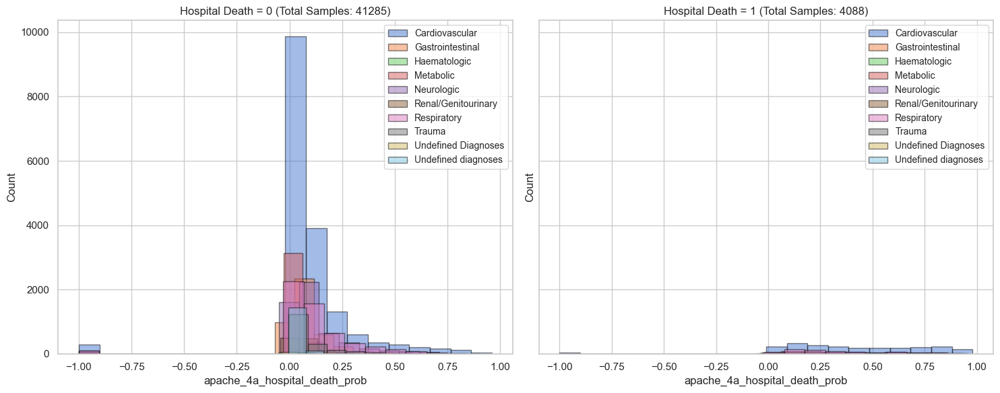

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Convert categorical x-axis values to numeric codes
df["x_numeric"] = df["apache_2_bodysystem"].astype("category").cat.codes
categories = df["apache_2_bodysystem"].astype("category").cat.categories

# Filter the dataframe for each hospital_death value
df_green = df[df["hospital_death"] == 0].copy()
df_red = df[df["hospital_death"] == 1].copy()

# Create the figure and axis
fig2, axs2 = plt.subplots(1, 2, figsize=(15, 6), sharey=True)

# Helper function to plot histograms for a given group and axis
def plot_histograms(ax, df_group, group_title):
    for cat in categories:
        # Filter the group for the current apache_2_bodysystem category
        subset = df_group[df_group["apache_2_bodysystem"] == cat]
        # Plot the histogram
        ax.hist(
            subset["apache_4a_hospital_death_prob"],
            bins=20,
            alpha=0.5,
            label=cat,
            edgecolor="black"
        )
    ax.set_title(f"{group_title} (Total Samples: {len(df_group)})")
    ax.set_xlabel("apache_4a_hospital_death_prob")
    ax.set_ylabel("Count")
    ax.legend(fontsize='small', loc='best')

plot_histograms(axs2[0], df_green, "Hospital Death = 0")
plot_histograms(axs2[1], df_red, "Hospital Death = 1")

plt.tight_layout()
plt.show()

I honestly don't know how to interpret this but thought that migh be useful.

Another remark is that I've also plotted the box plots for each feature separating by mortality outcome and there was no clear indication of mortality. The most informative was age but even that had overlapping box plots.

Within those box plots, most of features had lots of outliers

Final toughts are:
- We have lots of missing values and the choice of dealing with those (estimating, removing, etc.) will affect the bias present. So one idea is to compare the results of different methods of handling missing values. For example we can compare the model's results on two settings where in one we can discard the missing values and in the other we can try to estimate them.

- We can use a random forest and analyze its trees to understand the data. For example we can look at the features that the model relies on the most or investigate the decision thresholds to have some insights.

- We have an imbalanced dataset in several aspects. The choice of how we proceed with this is also important in terms of the project's scope (using fairness metrics etc.)